# style transfer for QR code

https://antfu.me/posts/ai-qrcode-101

https://qrcode.antfu.me/#scan

## prompt1

In [28]:
from diffusers import DiffusionPipeline

pipe = DiffusionPipeline.from_pretrained("stablediffusionapi/primemix-v21")
pipe.to("cuda" if torch.cuda.is_available() else "cpu")

prompt = "Banh Mi Sandwich, Restaurant photography, HD, Golden light"
image = pipe(prompt).images[0]

text_encoder/model.safetensors not found
Loading pipeline components...:  43%|███████████████████████████████████████████████████████████████████▋                                                                                          | 3/7 [00:00<00:00,  4.48it/s]An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 5/7 [00:01<00:00,  3.96it/s]An error occurred while trying to fetch /root/.cache/

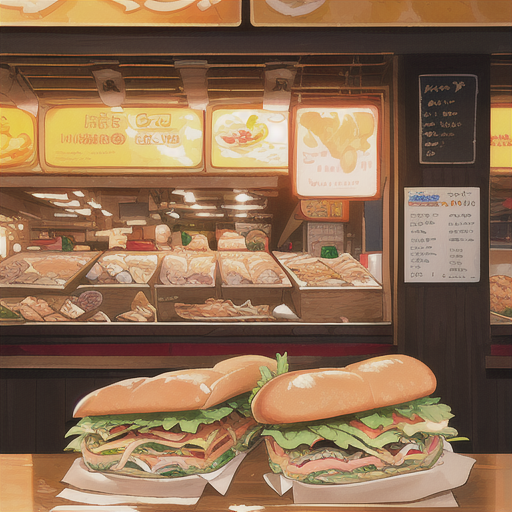

In [29]:
image

An error occurred while trying to fetch Nacholmo/controlnet-qr-pattern-v2: Nacholmo/controlnet-qr-pattern-v2 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
text_encoder/model.safetensors not found
Loading pipeline components...:  43%|███████████████████████████████████████████████████████████████████▋                                                                                          | 3/7 [00:00<00:00,  4.57it/s]An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loadin

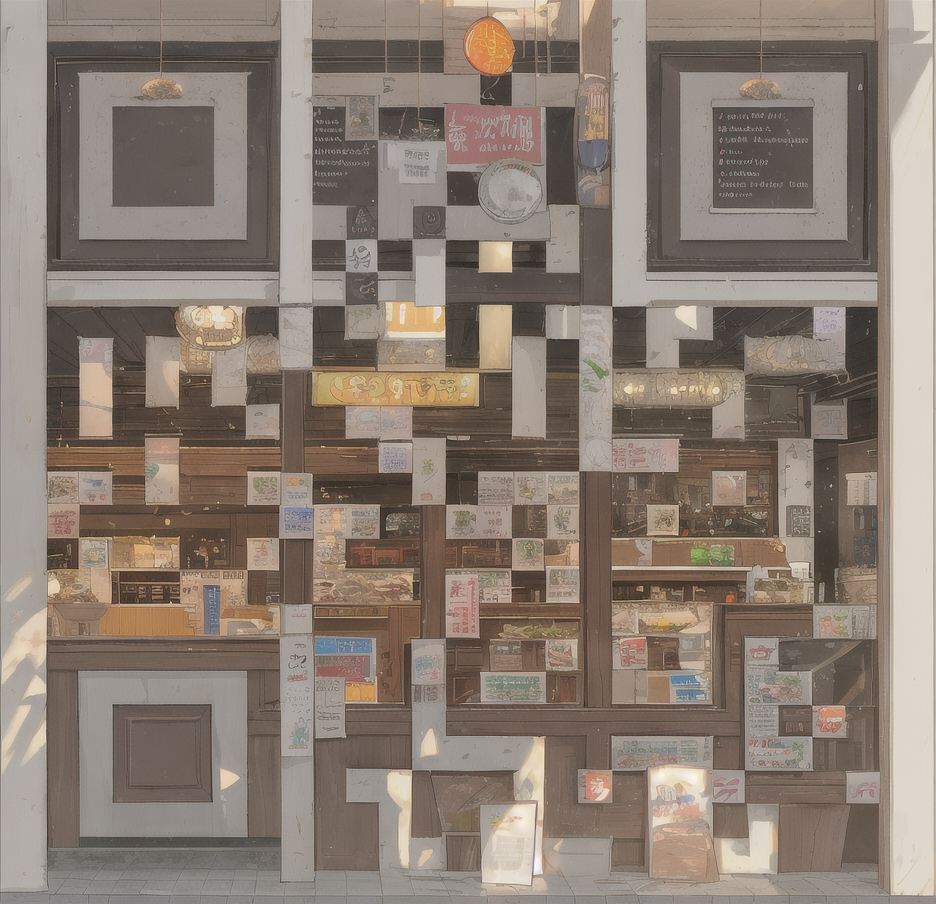

In [30]:
import torch
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline
from PIL import Image
import random
import numpy as np


seed = 932172184
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

    
# ControlNet model for QR codes
controlnet = ControlNetModel.from_pretrained("Nacholmo/controlnet-qr-pattern-v2")
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stablediffusionapi/primemix-v21",
    controlnet=controlnet
)

pipe.to("cuda" if torch.cuda.is_available() else "cpu")

input_image = Image.open("qrcode.jpg")

prompt = "Banh Mi Sandwich, Restaurant photography, HD, Golden light"
negative_prompt = 'low quality, bad quality, sketches, nudity, violence'

# CFG scale
cfg_scale = 6  # scale

# run pipeline
output = pipe(
    prompt=prompt,
    # negative_prompt=negative_prompt,
    image=input_image,
    num_inference_steps=50,  # steps
    controlnet_conditioning_weight=1.0,  # ControlNet weight
    controlnet_conditioning_mode='balanced',  # Control mode
    controlnet_starting_ending=(0, 1.0),  # start/end
    guidance_scale=cfg_scale  # finetune scale
)


output_image = output.images[0]
# output_image.save("generated_image.png")
output_image.show()

del pipe
torch.cuda.empty_cache()

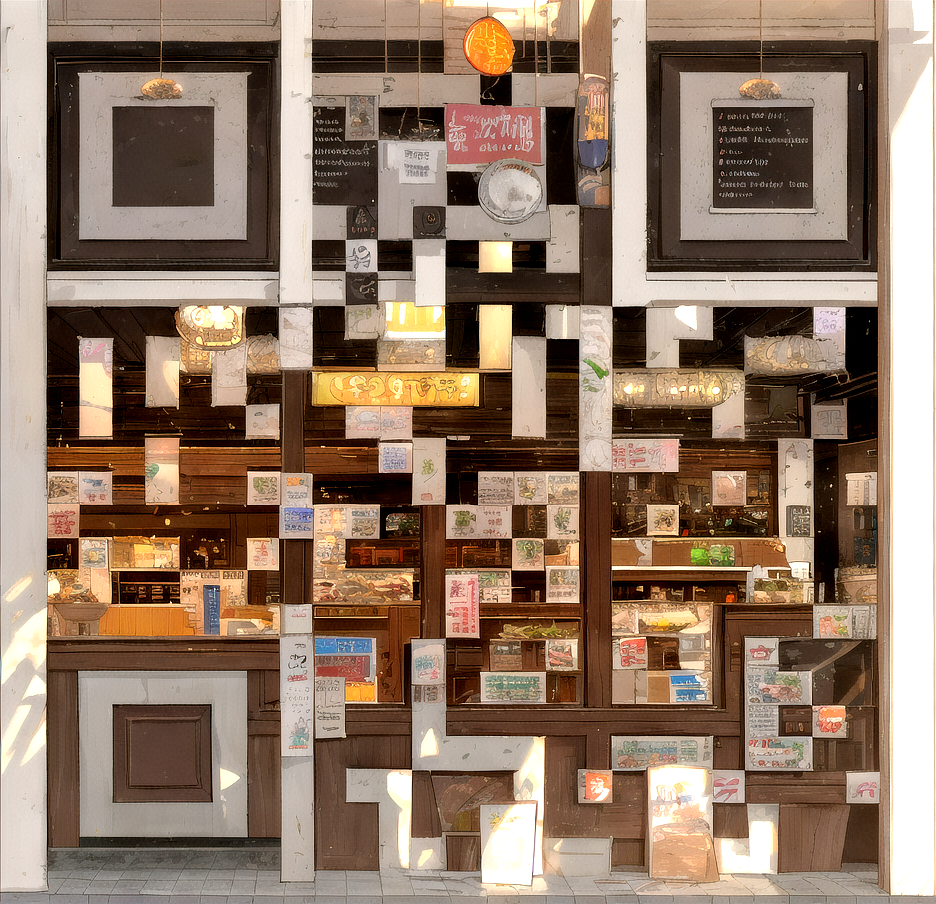

In [31]:
from PIL import Image, ImageEnhance

enhancer = ImageEnhance.Contrast(output_image)

# contrast, >1 for higher contrast
contrast_factor = 2
enhanced_image = enhancer.enhance(contrast_factor)

enhanced_image.save("p1-generated_image_1.png")
enhanced_image.show()

## prompt2

text_encoder/model.safetensors not found
Loading pipeline components...:  43%|███████████████████████████████████████████████████████████████████▋                                                                                          | 3/7 [00:00<00:00,  4.26it/s]An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 5/7 [00:01<00:00,  3.57it/s]An error occurred while trying to fetch /root/.cache/

Used seed: 3792549494


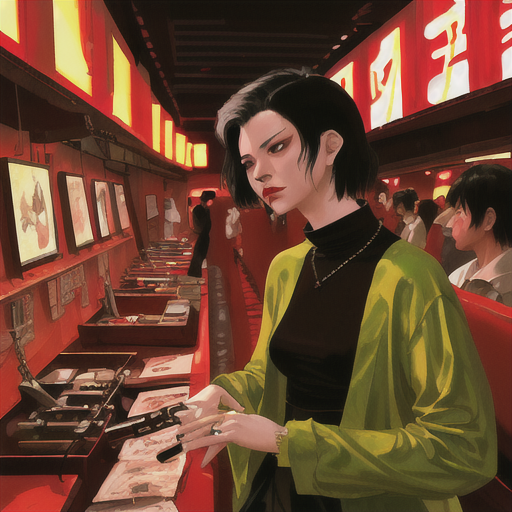

In [89]:
import random
import numpy as np
import torch
from diffusers import DiffusionPipeline

seed = random.randint(0, 2**32 - 1)
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

pipe = DiffusionPipeline.from_pretrained("stablediffusionapi/primemix-v21")
pipe.to("cuda" if torch.cuda.is_available() else "cpu")

prompt = "Wong Kar Wai styled scene"

image = pipe(prompt, generator=torch.manual_seed(seed)).images[0]

print(f"Used seed: {seed}")

image

text_encoder/model.safetensors not found
Loading pipeline components...:   0%|                                                                                                                                                                      | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 6/7 [00:01<00:00,  5.66it/s]An error occurred while trying to fetch /root/.cache/

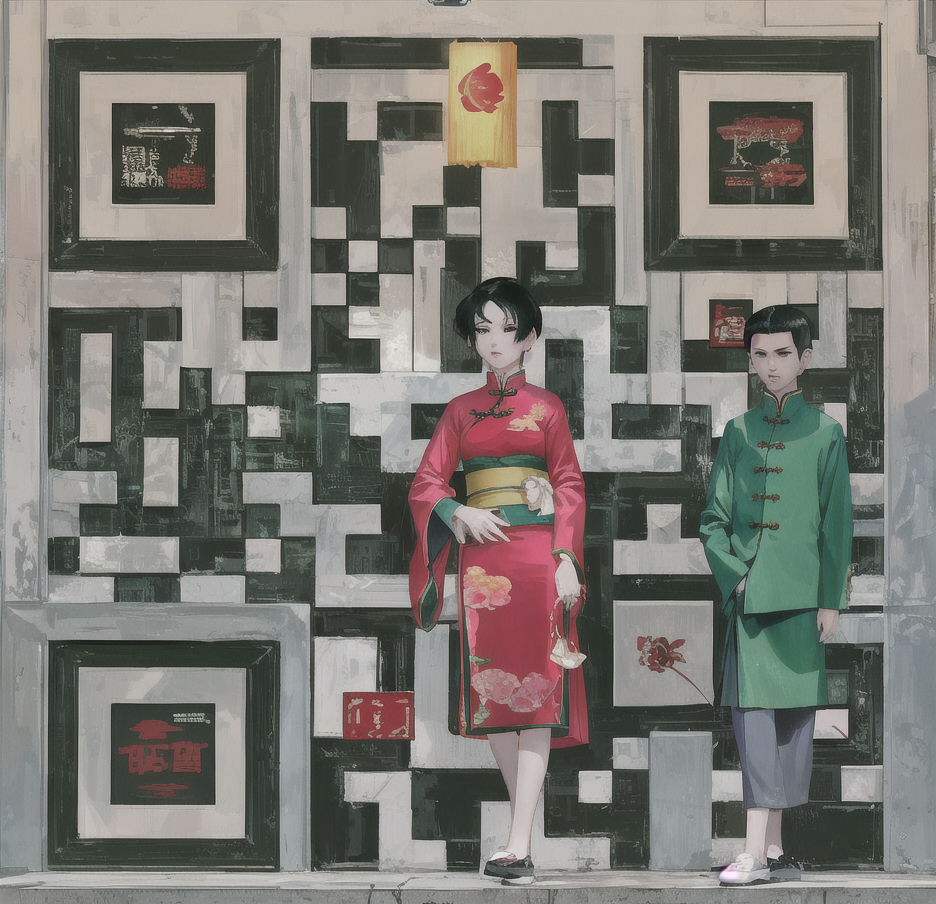

In [3]:
import torch
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline
from PIL import Image
import random
import numpy as np


seed = 3792549494 # 3792549494
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

    
# ControlNet model for QR codes
# controlnet = ControlNetModel.from_pretrained("Nacholmo/controlnet-qr-pattern-v2")
controlnet = ControlNetModel.from_pretrained("monster-labs/control_v1p_sd15_qrcode_monster")
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stablediffusionapi/primemix-v21",
    controlnet=controlnet
)

pipe.to("cuda" if torch.cuda.is_available() else "cpu")

input_image = Image.open("qrcode.jpg")

prompt = "Wong Kar Wai styled scene, Chinese"
negative_prompt = 'low quality, bad quality, sketches, nudity, violence'

# CFG scale
cfg_scale = 6  # scale

# run pipeline
output = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=input_image,
    num_inference_steps=50,  # steps
    controlnet_conditioning_weight=2.0,  # ControlNet weight
    controlnet_conditioning_mode='balanced',  # Control mode
    controlnet_starting_ending=(0, 2.0),  # start/end
    guidance_scale=cfg_scale  # finetune scale
)


output_image = output.images[0]
# output_image.save("generated_image.png")
output_image.show()

del pipe
torch.cuda.empty_cache()

In [64]:
# from PIL import Image, ImageEnhance

# # contrast, >1 for higher contrast
# enhancer_contrast = ImageEnhance.Contrast(output_image)
# contrast_factor = 1.0
# contrast_enhanced_image = enhancer_contrast.enhance(contrast_factor)

# # brightness, >1 for higher contrast
# enhancer_brightness = ImageEnhance.Brightness(contrast_enhanced_image)
# brightness_factor = 1.5
# enhanced_image = enhancer_brightness.enhance(brightness_factor)

# enhanced_image.save("p2-generated_image_1.png")
# enhanced_image.show()

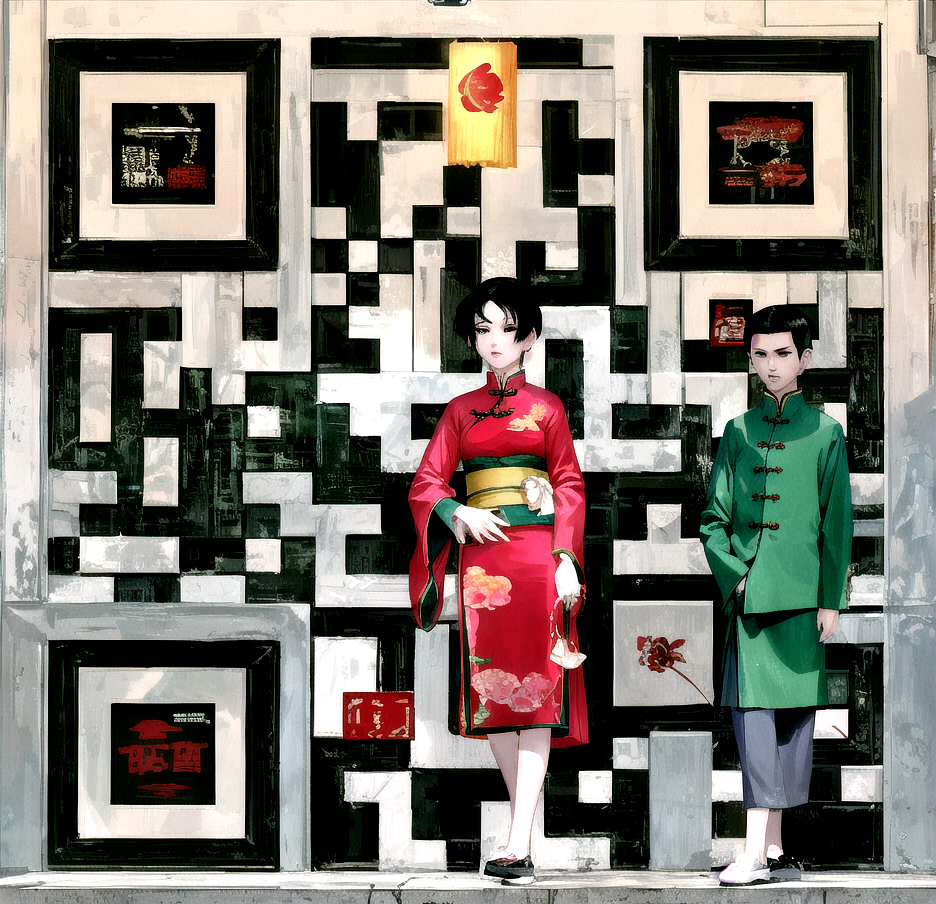

In [4]:
from PIL import Image, ImageEnhance

enhancer = ImageEnhance.Contrast(output_image)

# contrast, >1 for higher contrast
contrast_factor = 2
enhanced_image = enhancer.enhance(contrast_factor)

enhanced_image.save("p2-generated_image_2.png")
enhanced_image.show()

## prompt3

In [32]:
from diffusers import DiffusionPipeline

pipe = DiffusionPipeline.from_pretrained("stablediffusionapi/primemix-v21")
pipe.to("cuda" if torch.cuda.is_available() else "cpu")

prompt = "best quality, masterpiece, depth of field, girl, dress, trees, flowers, sky, water"
image = pipe(prompt).images[0]

text_encoder/model.safetensors not found
Loading pipeline components...:  43%|███████████████████████████████████████████████████████████████████▋                                                                                          | 3/7 [00:00<00:00,  4.77it/s]An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 5/7 [00:01<00:00,  4.12it/s]An error occurred while trying to fetch /root/.cache/

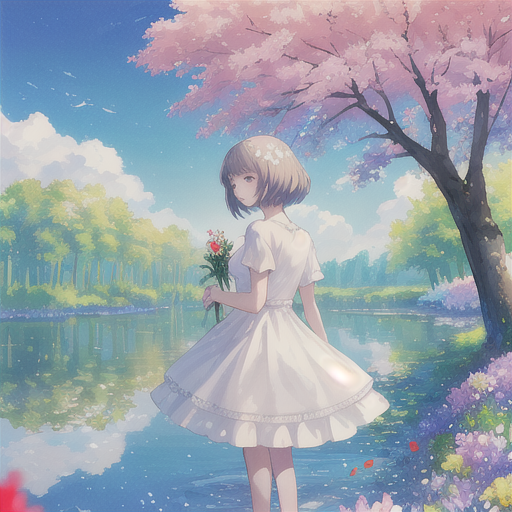

In [33]:
image

An error occurred while trying to fetch Nacholmo/controlnet-qr-pattern-v2: Nacholmo/controlnet-qr-pattern-v2 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
text_encoder/model.safetensors not found
Loading pipeline components...:  43%|███████████████████████████████████████████████████████████████████▋                                                                                          | 3/7 [00:00<00:00,  5.10it/s]An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stablediffusionapi--primemix-v21/snapshots/8c4944656babd3a6d28f51387d261910a531ce02/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loadin

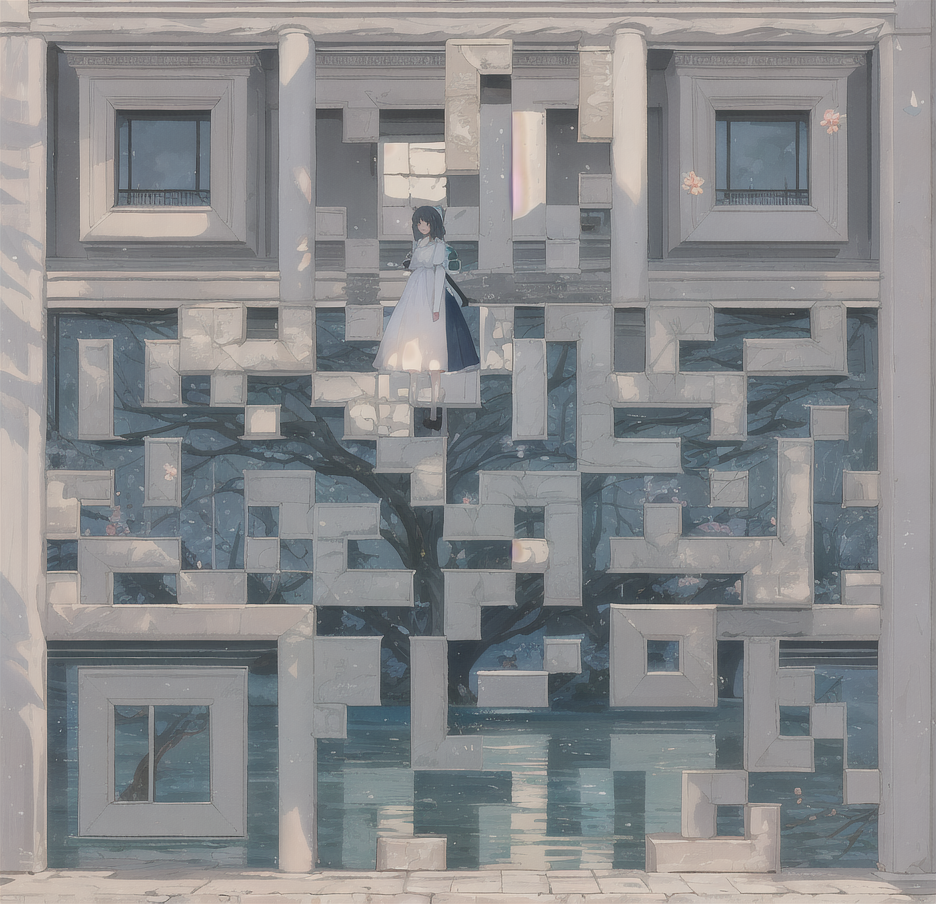

In [34]:
import torch
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline
from PIL import Image
import random
import numpy as np


seed = 73120543 # 1982357437 935842
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

    
# ControlNet model for QR codes
controlnet = ControlNetModel.from_pretrained("Nacholmo/controlnet-qr-pattern-v2")
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stablediffusionapi/primemix-v21",
    controlnet=controlnet
)

pipe.to("cuda" if torch.cuda.is_available() else "cpu")

input_image = Image.open("qrcode.jpg")

prompt = "best quality, masterpiece, depth of field, girl, dress, trees, flowers, sky, water"
negative_prompt = 'low quality, bad quality, sketches, nudity, violence'

# CFG scale
cfg_scale = 6  # scale

# run pipeline
output = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=input_image,
    num_inference_steps=50,  # steps
    controlnet_conditioning_weight=1.0,  # ControlNet weight
    controlnet_conditioning_mode='balanced',  # Control mode
    controlnet_starting_ending=(0, 1.0),  # start/end
    guidance_scale=cfg_scale  # finetune scale
)


output_image = output.images[0]
# output_image.save("generated_image.png")
output_image.show()

del pipe
torch.cuda.empty_cache()

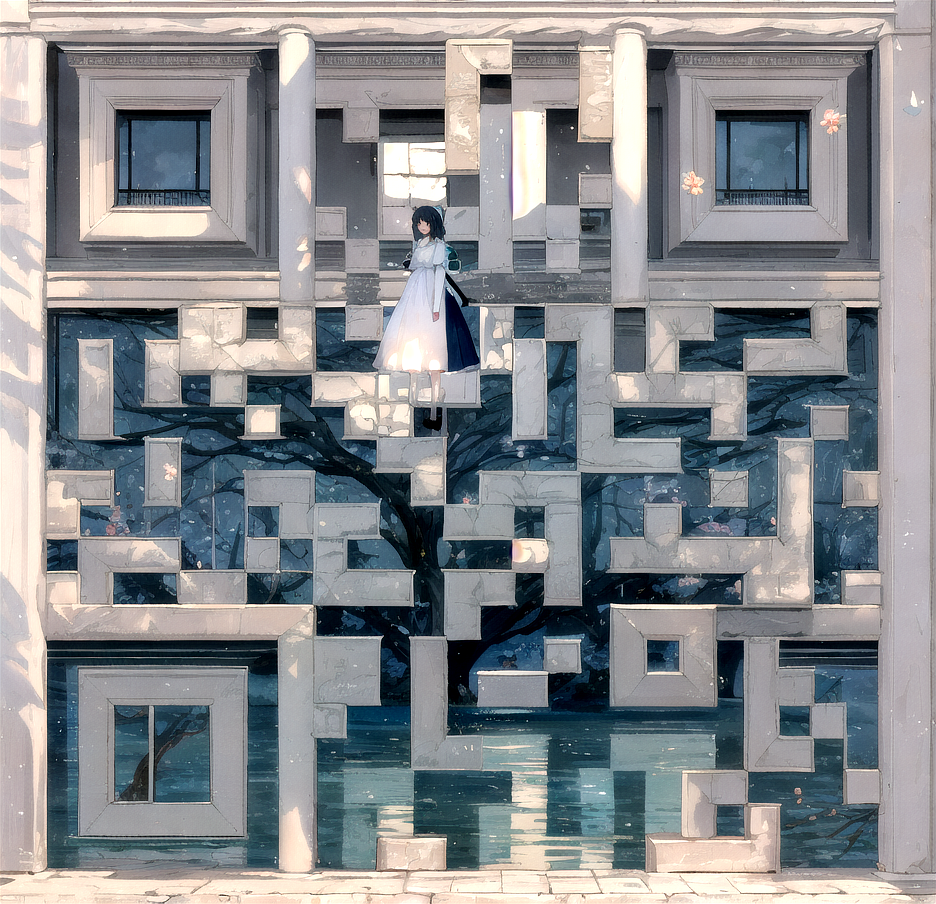

In [36]:
from PIL import Image, ImageEnhance

enhancer = ImageEnhance.Contrast(output_image)

# contrast, >1 for higher contrast
contrast_factor = 2
enhanced_image = enhancer.enhance(contrast_factor)

enhanced_image.save("p3-generated_image_1.png")
enhanced_image.show()